In [1]:
import pandas as pd
import numpy as np
import pandas_profiling as pp

In [108]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


In [2]:
pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
data = pd.read_csv("telecom_churn_data.csv")
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [4]:
data.shape

(99999, 226)

In [5]:
data['circle_id'].value_counts()

109    99999
Name: circle_id, dtype: int64

In [6]:
#Checking the na values in data column wise
data.isna().sum()

mobile_number                   0
circle_id                       0
loc_og_t2o_mou               1018
std_og_t2o_mou               1018
loc_ic_t2o_mou               1018
last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
arpu_6                          0
arpu_7                          0
arpu_8                          0
arpu_9                          0
onnet_mou_6                  3937
onnet_mou_7                  3859
onnet_mou_8                  5378
onnet_mou_9                  7745
offnet_mou_6                 3937
offnet_mou_7                 3859
offnet_mou_8                 5378
offnet_mou_9                 7745
roam_ic_mou_6                3937
roam_ic_mou_7                3859
roam_ic_mou_8                5378
roam_ic_mou_9                7745
roam_og_mou_6                3937
roam_og_mou_7                3859
roam_og_mou_8                5378
roam_og_mou_9                7745
loc_og_t2t_mou

In [7]:
#Univariate Analysis Report
pp.ProfileReport(data)

Number of variables,226
Number of observations,99999
Total Missing (%),0.0%
Total size in memory,167.8 MiB
Average record size in memory,1.7 KiB
Numeric,187
Categorical,11
Boolean,11
Date,0
Text (Unique),0
Rejected,17


In [8]:
#Feature Engineering
#avg_rech_amt_good: average recharge amount in the first two months (the good phase).
data['avg_rech_amt_good'] = (data['total_rech_amt_6']+ data['total_rech_amt_7'])/2
data['avg_rech_amt_good'].head()

0    307.0
1    229.0
2    241.5
3    270.0
4    273.0
Name: avg_rech_amt_good, dtype: float64

In [9]:
#Calculation of X ()
X = np.percentile(data['avg_rech_amt_good'],70)
X

368.5

In [10]:
#Filtering High Value customers
#Customers who have recharged with an amount more than or equal to X=368.5 are high value customers
data_HV= data[data['avg_rech_amt_good']>=X]
data_HV.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_amt_good
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,0.0,0.0,0.0,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44

In [11]:
data_HV.shape

(30011, 227)

In [16]:
#Univariate Analysis Report
#pp.ProfileReport(data_HV)

In [12]:
#Dropping variables due to very high missing value

data_HV= data_HV.drop(columns=['arpu_2g_9','arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9','count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_2g_9','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','count_rech_3g_9','date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9','fb_user_6','fb_user_7','fb_user_8','fb_user_9','max_rech_data_6','max_rech_data_7','max_rech_data_8','max_rech_data_9','night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9','total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','arpu_2g_6','arpu_2g_7','arpu_2g_8'],axis=1)
data_HV.isna().sum()

mobile_number              0
circle_id                  0
loc_og_t2o_mou           114
std_og_t2o_mou           114
loc_ic_t2o_mou           114
last_date_of_month_6       0
last_date_of_month_7      31
last_date_of_month_8     157
last_date_of_month_9     360
arpu_6                     0
arpu_7                     0
arpu_8                     0
arpu_9                     0
onnet_mou_6              316
onnet_mou_7              303
onnet_mou_8              938
onnet_mou_9             1704
offnet_mou_6             316
offnet_mou_7             303
offnet_mou_8             938
offnet_mou_9            1704
roam_ic_mou_6            316
roam_ic_mou_7            303
roam_ic_mou_8            938
roam_ic_mou_9           1704
roam_og_mou_6            316
roam_og_mou_7            303
roam_og_mou_8            938
roam_og_mou_9           1704
loc_og_t2t_mou_6         316
loc_og_t2t_mou_7         303
loc_og_t2t_mou_8         938
loc_og_t2t_mou_9        1704
loc_og_t2m_mou_6         316
loc_og_t2m_mou

In [13]:
data_HV.isnull().sum()

mobile_number              0
circle_id                  0
loc_og_t2o_mou           114
std_og_t2o_mou           114
loc_ic_t2o_mou           114
last_date_of_month_6       0
last_date_of_month_7      31
last_date_of_month_8     157
last_date_of_month_9     360
arpu_6                     0
arpu_7                     0
arpu_8                     0
arpu_9                     0
onnet_mou_6              316
onnet_mou_7              303
onnet_mou_8              938
onnet_mou_9             1704
offnet_mou_6             316
offnet_mou_7             303
offnet_mou_8             938
offnet_mou_9            1704
roam_ic_mou_6            316
roam_ic_mou_7            303
roam_ic_mou_8            938
roam_ic_mou_9           1704
roam_og_mou_6            316
roam_og_mou_7            303
roam_og_mou_8            938
roam_og_mou_9           1704
loc_og_t2t_mou_6         316
loc_og_t2t_mou_7         303
loc_og_t2t_mou_8         938
loc_og_t2t_mou_9        1704
loc_og_t2m_mou_6         316
loc_og_t2m_mou

In [14]:
#Dropping all rows with Nan values 
data_HV = data_HV.dropna(axis=0, how='any')
data_HV.isna().sum()

mobile_number           0
circle_id               0
loc_og_t2o_mou          0
std_og_t2o_mou          0
loc_ic_t2o_mou          0
last_date_of_month_6    0
last_date_of_month_7    0
last_date_of_month_8    0
last_date_of_month_9    0
arpu_6                  0
arpu_7                  0
arpu_8                  0
arpu_9                  0
onnet_mou_6             0
onnet_mou_7             0
onnet_mou_8             0
onnet_mou_9             0
offnet_mou_6            0
offnet_mou_7            0
offnet_mou_8            0
offnet_mou_9            0
roam_ic_mou_6           0
roam_ic_mou_7           0
roam_ic_mou_8           0
roam_ic_mou_9           0
roam_og_mou_6           0
roam_og_mou_7           0
roam_og_mou_8           0
roam_og_mou_9           0
loc_og_t2t_mou_6        0
loc_og_t2t_mou_7        0
loc_og_t2t_mou_8        0
loc_og_t2t_mou_9        0
loc_og_t2m_mou_6        0
loc_og_t2m_mou_7        0
loc_og_t2m_mou_8        0
loc_og_t2m_mou_9        0
loc_og_t2f_mou_6        0
loc_og_t2f_m

In [16]:
data_HV.shape

(27418, 187)

In [17]:
#Feature Engineering
#Creating a variable that depicts the total calls(IC+OG) and data (2g+3g) used in the churn phase.
data_HV['total_call_data'] = data_HV['total_ic_mou_9']+data_HV['total_og_mou_9']+data_HV['vol_2g_mb_9']+data_HV['vol_3g_mb_9']
data_HV['total_call_data'].head()

8      177.09
13    1077.95
16     590.30
17     718.21
21    1284.14
Name: total_call_data, dtype: float64

In [18]:
#Creating the churn variable; 1 signifies customer churned
data_HV['churn'] = list(map(lambda x: 1 if x==0 else 0 ,data_HV['total_call_data']))
#data_HV['churn'] = map(lambda x: 1 if x==0 else 0 ,data_HV['total_call_data'])
data_HV['churn'].head()

8     0
13    0
16    0
17    0
21    0
Name: churn, dtype: int64

In [19]:
#Checking the response rate in filtered data
data_HV['churn'].value_counts()

0    26507
1      911
Name: churn, dtype: int64

In [20]:
#Dropping variables of churn phase
data_HV= data_HV.drop(columns=['total_call_data','total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9','arpu_9','onnet_mou_9','offnet_mou_9','roam_ic_mou_9','roam_og_mou_9','loc_og_t2t_mou_9','loc_og_t2m_mou_9','loc_og_t2f_mou_9','loc_og_t2c_mou_9','loc_og_mou_9','std_og_t2t_mou_9','std_og_t2m_mou_9','std_og_t2f_mou_9','std_og_mou_9','isd_og_mou_9','spl_og_mou_9','og_others_9','total_og_mou_9','loc_ic_t2t_mou_9','loc_ic_t2m_mou_9','loc_ic_t2f_mou_9','loc_ic_mou_9','std_ic_t2t_mou_9','std_ic_t2m_mou_9','std_ic_t2f_mou_9','std_ic_mou_9','total_ic_mou_9','spl_ic_mou_9','isd_ic_mou_9','ic_others_9','total_rech_num_9','total_rech_amt_9','max_rech_amt_9','last_day_rch_amt_9','monthly_2g_9','sachet_2g_9','monthly_3g_9','sachet_3g_9','sachet_3g_9','sep_vbc_3g','date_of_last_rech_9'],axis=1)

In [21]:
data_HV.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_amt_good,churn
count,2.741800e+04,27418.0,27418.0,27418.0,27418.0,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.0,27418.0,27418.0,27418.0,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.00000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.0,27418.0,27418.0,27418.0,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000,27418.000000
mean,7.001230e+09,109.0,0.0,0.0,0.0,584.053253,596.390146,560.479179,295.561404,310.025112,283.256279,417.042079,431.043660,395.171105,17.422232,13.622114,13.888927,29.148205,22.051034,22.386487,96.879108,99.683622,92.932317,184.760295,18

In [22]:
#Dropping variables with constant values
data_HV= data_HV.drop(columns=['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9'],axis=1)
data_HV.shape

(27418, 130)

In [23]:
#Rigourous Feature Engineering of variables; Creating indicators for the good phase and action phase.

data_HV['avg_rech_amt_good_ind'] = map(lambda x,y: 0 if x <= y else 1 , data_HV['avg_rech_amt_good'],data_HV['total_rech_amt_8'])

#Eg: If the avg arpu for good phase is less or equal to the action phase
#(which means the arpu for action phase has increased, assuming in case of churn the behavior would be reverse) flag 0, else flag 1.

data_HV['avg_arpu_good'] = (data_HV['arpu_6']+ data_HV['arpu_7'])/2
data_HV['avg_arpu_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_arpu_good'],data_HV['arpu_8'])

data_HV['avg_onnet_mou_good'] = (data_HV['onnet_mou_6']+ data_HV['onnet_mou_7'])/2
data_HV['avg_onnet_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_onnet_mou_good'],data_HV['onnet_mou_8'])

data_HV['avg_offnet_mou_good'] = (data_HV['offnet_mou_6']+ data_HV['offnet_mou_7'])/2
data_HV['avg_offnet_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_offnet_mou_good'],data_HV['offnet_mou_8'])

data_HV['avg_roam_ic_mou_good'] = (data_HV['roam_ic_mou_6']+ data_HV['roam_ic_mou_7'])/2
data_HV['avg_roam_ic_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_roam_ic_mou_good'],data_HV['roam_ic_mou_8'])

data_HV['avg_roam_og_mou_good'] = (data_HV['roam_og_mou_6']+ data_HV['roam_og_mou_7'])/2
data_HV['avg_roam_og_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_roam_og_mou_good'],data_HV['roam_og_mou_8'])

data_HV['avg_loc_og_t2t_mou_good'] = (data_HV['loc_og_t2t_mou_6']+ data_HV['loc_og_t2t_mou_7'])/2
data_HV['avg_loc_og_t2t_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_loc_og_t2t_mou_good'],data_HV['loc_og_t2t_mou_8'])

data_HV['avg_loc_og_t2m_mou_good'] = (data_HV['loc_og_t2m_mou_6']+ data_HV['loc_og_t2m_mou_7'])/2
data_HV['avg_loc_og_t2m_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_loc_og_t2m_mou_good'],data_HV['loc_og_t2m_mou_8'])

data_HV['avg_loc_og_t2f_mou_good'] = (data_HV['loc_og_t2f_mou_6']+ data_HV['loc_og_t2f_mou_7'])/2
data_HV['avg_loc_og_t2f_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_loc_og_t2f_mou_good'],data_HV['loc_og_t2f_mou_8'])

data_HV['avg_loc_og_t2c_mou_good'] = (data_HV['loc_og_t2c_mou_6']+ data_HV['loc_og_t2c_mou_7'])/2
data_HV['avg_loc_og_t2c_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_loc_og_t2c_mou_good'],data_HV['loc_og_t2c_mou_8'])

data_HV['avg_loc_og_mou_good'] = (data_HV['loc_og_mou_6']+ data_HV['loc_og_mou_7'])/2
data_HV['avg_loc_og_mou_good_ind'] = map(lambda x,y: 0 if x <= y else 1 ,data_HV['avg_loc_og_mou_good'], data_HV['loc_og_mou_8'])

data_HV['avg_std_og_t2t_mou_good'] = (data_HV['std_og_t2t_mou_6']+ data_HV['std_og_t2t_mou_7'])/2
data_HV['avg_std_og_t2t_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_std_og_t2t_mou_good'],data_HV['std_og_t2t_mou_8'])

data_HV['avg_std_og_t2m_mou_good'] = (data_HV['std_og_t2m_mou_6']+ data_HV['std_og_t2m_mou_7'])/2
data_HV['avg_std_og_t2m_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_std_og_t2m_mou_good'],data_HV['std_og_t2m_mou_8'])

data_HV['avg_std_og_t2f_mou_good'] = (data_HV['std_og_t2f_mou_6']+ data_HV['std_og_t2f_mou_7'])/2
data_HV['avg_std_og_t2f_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_std_og_t2f_mou_good'],data_HV['std_og_t2f_mou_8'])


data_HV['avg_std_og_mou_good'] = (data_HV['std_og_mou_6']+ data_HV['std_og_mou_7'])/2
data_HV['avg_std_og_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_std_og_mou_good'],data_HV['std_og_mou_8'])

data_HV['avg_total_og_mou_good'] = (data_HV['total_og_mou_6']+ data_HV['total_og_mou_7'])/2
data_HV['avg_total_og_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_total_og_mou_good'],data_HV['total_og_mou_8'])

data_HV['avg_og_others_good'] = (data_HV['og_others_6']+ data_HV['og_others_7'])/2
data_HV['avg_og_others_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_og_others_good'],data_HV['og_others_8'])

data_HV['avg_spl_og_mou_good'] = (data_HV['spl_og_mou_6']+ data_HV['spl_og_mou_7'])/2
data_HV['avg_spl_og_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_spl_og_mou_good'],data_HV['spl_og_mou_8'])

data_HV['avg_isd_og_mou_good'] = (data_HV['isd_og_mou_6']+ data_HV['isd_og_mou_7'])/2
data_HV['avg_isd_og_mou_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_isd_og_mou_good'],data_HV['isd_og_mou_8'])


data_HV['avg_vbc_3g_good'] = (data_HV['jun_vbc_3g']+ data_HV['jul_vbc_3g'])/2
data_HV['avg_vbc_3g_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_vbc_3g_good'],data_HV['aug_vbc_3g'])

data_HV['avg_sachet_3g_good'] = (data_HV['sachet_3g_6']+ data_HV['sachet_3g_7'])/2
data_HV['avg_sachet_3g_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_sachet_3g_good'],data_HV['sachet_3g_8'])

data_HV['avg_monthly_3g_good'] = (data_HV['monthly_3g_6']+ data_HV['monthly_3g_7'])/2
data_HV['avg_monthly_3g_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_monthly_3g_good'],data_HV['monthly_3g_8'])

data_HV['avg_sachet_2g_good'] = (data_HV['sachet_2g_6']+ data_HV['sachet_2g_7'])/2
data_HV['avg_sachet_2g_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_sachet_2g_good'],data_HV['sachet_2g_8'])

data_HV['avg_monthly_2g_good'] = (data_HV['monthly_2g_6']+ data_HV['monthly_2g_7'])/2
data_HV['avg_monthly_2g_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_monthly_2g_good'],data_HV['monthly_2g_8'])

data_HV['avg_vol_3g_mb_good'] = (data_HV['vol_3g_mb_6']+ data_HV['vol_3g_mb_7'])/2
data_HV['avg_vol_3g_mb_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_vol_3g_mb_good'],data_HV['vol_3g_mb_8'])

data_HV['avg_vol_2g_mb_good'] = (data_HV['vol_2g_mb_6']+ data_HV['vol_2g_mb_7'])/2
data_HV['avg_vol_2g_mb_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_vol_2g_mb_good'],data_HV['vol_2g_mb_8'])

data_HV['avg_max_rech_amt_good'] = (data_HV['max_rech_amt_6']+ data_HV['max_rech_amt_7'])/2
data_HV['avg_max_rech_amt_good_ind'] = map(lambda x,y: 0 if x <= y  else 1 ,data_HV['avg_max_rech_amt_good'],data_HV['max_rech_amt_8'])


In [24]:
data_HV.shape

(27418, 183)

# Exploratory data analysis observations
#1. The response rate is approx 3.4% in the filtered data.
#2. The raw data has 226 variables and 99999 observations. 
#3. The raw data has 17 highly corelated variables.
#4. The final data_HV has 27418 rows and 136 variables.
#5. 


In [25]:
#Converting the columns to datetime format
import datetime as dt
data_HV['date_of_last_rech_6'] = data_HV['date_of_last_rech_6'].apply(lambda x: dt.datetime.strptime(x,'%m/%d/%Y').date())
data_HV['date_of_last_rech_7'] = data_HV['date_of_last_rech_7'].apply(lambda x: dt.datetime.strptime(x,'%m/%d/%Y').date())
data_HV['date_of_last_rech_8'] = data_HV['date_of_last_rech_8'].apply(lambda x: dt.datetime.strptime(x,'%m/%d/%Y').date())
#data_HV['date_of_last_rech_9'] = data_HV['date_of_last_rech_9'].apply(lambda x: dt.datetime.strptime(x,'%m/%d/%Y').date())

In [26]:
#Feature Engineering: Creating no. of active days columns for every month.
data_HV['diff_1'] = (data_HV['date_of_last_rech_7']-data_HV['date_of_last_rech_6']).dt.days
data_HV['diff_2'] = (data_HV['date_of_last_rech_8']-data_HV['date_of_last_rech_7']).dt.days
#data_HV['diff_3'] = (data_HV['date_of_last_rech_9']-data_HV['date_of_last_rech_8']).dt.days

In [27]:
#Combined active days
data_HV['active_days'] = (data_HV['diff_1']+data_HV['diff_2'])
data_HV['active_days'].head()

8     66
13    71
16    45
17    56
21    62
Name: active_days, dtype: int64

In [ ]:
pp.ProfileReport(data_HV)

In [31]:
#Drop the redundant columns after creating the indicators
# data_HV = data_HV.drop(columns=['diff_1','diff_2','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','std_og_t2m_mou_6','std_og_t2t_mou_6','loc_og_mou_6','loc_og_t2c_mou_6','loc_og_t2f_mou_6','loc_og_t2m_mou_6','loc_og_t2t_mou_6','roam_og_mou_6','roam_ic_mou_6','offnet_mou_6','onnet_mou_6','arpu_6','std_og_t2m_mou_7','std_og_t2t_mou_7','loc_og_mou_7','loc_og_t2c_mou_7','loc_og_t2f_mou_7','loc_og_t2m_mou_7','loc_og_t2t_mou_7','roam_og_mou_7','roam_ic_mou_7','offnet_mou_7','onnet_mou_7','arpu_7','std_og_t2m_mou_8','std_og_t2t_mou_8','loc_og_mou_8','loc_og_t2c_mou_8','loc_og_t2f_mou_8','loc_og_t2m_mou_8','loc_og_t2t_mou_8','roam_og_mou_8','roam_ic_mou_8','offnet_mou_8','onnet_mou_8','arpu_8','isd_og_mou_6','spl_og_mou_6','og_others_6','total_og_mou_6','std_og_mou_6','std_og_t2f_mou_6','isd_og_mou_7','spl_og_mou_7','og_others_7','total_og_mou_7','std_og_mou_7','std_og_t2f_mou_7','isd_og_mou_8','spl_og_mou_8','og_others_8','total_og_mou_8','std_og_mou_8','std_og_t2f_mou_8','jun_vbc_3g','jul_vbc_3g','aug_vbc_3g','sachet_3g_6','sachet_2g_6','monthly_3g_6','monthly_2g_6','vol_3g_mb_6','vol_2g_mb_6','max_rech_amt_6','sachet_3g_7','sachet_2g_7','monthly_3g_7','monthly_2g_7','vol_3g_mb_7','vol_2g_mb_7','max_rech_amt_7','sachet_3g_8','sachet_2g_8','monthly_3g_8','monthly_2g_8','vol_3g_mb_8','vol_2g_mb_8','max_rech_amt_8'],axis=1)
# data_HV.shape

(27418, 77)

In [28]:
#Drop the redundant columns after creating the indicators
data_HV = data_HV.drop(columns=['avg_rech_amt_good_ind','avg_arpu_good','avg_onnet_mou_good','avg_offnet_mou_good','avg_roam_ic_mou_good','avg_roam_og_mou_good','avg_loc_og_t2t_mou_good','avg_loc_og_t2m_mou_good','avg_loc_og_t2f_mou_good','avg_loc_og_t2c_mou_good','avg_loc_og_mou_good','avg_std_og_t2t_mou_good','avg_std_og_t2m_mou_good','avg_std_og_t2f_mou_good','avg_std_og_mou_good','avg_total_og_mou_good','avg_og_others_good','avg_spl_og_mou_good','avg_isd_og_mou_good','avg_vbc_3g_good','avg_sachet_3g_good','avg_monthly_3g_good','avg_sachet_2g_good','avg_monthly_2g_good','avg_vol_3g_mb_good','avg_vol_2g_mb_good','avg_max_rech_amt_good'],axis=1)
data_HV.shape

(27418, 159)

In [29]:
#Dropping redundant columns
data_HV = data_HV.drop(columns=['diff_1','diff_2','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1)
data_HV.shape

(27418, 154)

In [32]:
#Dropping the ID variables
#data_HV = data_HV.drop(columns=['mobile_number'], axis=1)

In [30]:
#Prepare data for PCA 
data_PCA = pd.DataFrame(data_HV)
data_PCA.shape

(27418, 154)

# Running a PCA on the data

In [31]:
#Train-test split; importing library
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler


In [32]:
# Putting response variable to y
y = data_PCA['churn']
y.head(10)

8     0
13    0
16    0
17    0
21    0
24    0
33    0
38    0
41    0
48    0
Name: churn, dtype: int64

In [33]:
# Putting feature variable to X
X = data_PCA.drop(['mobile_number','churn'], axis=1)
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_amt_good,avg_arpu_good_ind,avg_onnet_mou_good_ind,avg_offnet_mou_good_ind,avg_roam_ic_mou_good_ind,avg_roam_og_mou_good_ind,avg_loc_og_t2t_mou_good_ind,avg_loc_og_t2m_mou_good_ind,avg_loc_og_t2f_mou_good_ind,avg_loc_og_t2c_mou_good_ind,avg_loc_og_mou_good_ind,avg_std_og_t2t_mou_good_ind,avg_std_og_t2m_mou_good_ind,avg_std_og_t2f_mou_good_ind,avg_std_og_mou_good_ind,avg_total_og_mou_good_ind,avg_og_others_good_ind,avg_spl_og_mou_good_ind,avg_isd_og_mou_good_ind,avg_vbc_3g_good_ind,avg_sachet_3g_good_ind,avg_monthly_3g_good_ind,avg_sachet_2g_good_ind,avg_monthly_2g_good_ind,avg_vol_3g_mb_good_ind,avg_vol_2g_mb_good_ind,avg_max_rech_amt_good_ind,active_days
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.0,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.0,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,1,1,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,1,0,0,0,1,1,1,1,66
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.0,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.0,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,380.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,71
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,

In [34]:
#Handling class imbalance with Random over sampling method
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(X, y)

In [35]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, train_size=0.7, test_size=0.3, random_state=100)

In [36]:
X_train.shape

(37109, 152)

In [37]:
y_train.shape

(37109,)

In [38]:
#Importing the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=100)

In [39]:
#Doing the PCA on the train data
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=100,
  svd_solver='randomized', tol=0.0, whiten=False)

In [40]:
pca.components_

array([[ 1.24859567e-01,  1.33466836e-01,  8.93846176e-02, ...,
        -1.75456919e-05, -2.23330788e-05, -1.81696625e-04],
       [ 9.35665084e-02,  1.69432206e-01,  2.39505449e-01, ...,
         6.32695007e-05, -8.36068368e-05,  7.85496153e-04],
       [ 1.23012599e-02,  4.80909056e-02,  6.52366270e-02, ...,
        -6.91644209e-06, -4.31345204e-05,  5.45115394e-04],
       ...,
       [ 2.45336763e-07,  4.61543940e-07, -1.63224370e-07, ...,
        -5.61363985e-05, -1.31234189e-04, -4.08309327e-06],
       [ 3.58085075e-07, -8.74702538e-08,  3.82532503e-07, ...,
        -1.06644019e-04,  1.86565738e-04, -4.42986217e-06],
       [-1.06940949e-15,  2.87537320e-16,  1.00325370e-16, ...,
         7.60416413e-15,  1.08500103e-14,  4.28319921e-16]])

In [41]:
colnames = list(X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1],'PC3':pca.components_[2],'PC4':pca.components_[3], 'Feature':colnames})
pcs_df.head()

,Feature,PC1,PC2,PC3,PC4
0,arpu_6,0.124860,0.093567,0.012301,0.126312
1,arpu_7,0.133467,0.169432,0.048091,-0.008395
2,arpu_8,0.089385,0.239505,0.065237,-0.134874
3,onnet_mou_6,0.172369,-0.077645,-0.323863,-0.020576
4,onnet_mou_7,0.189711,-0.011016,-0.288345,-0.170910


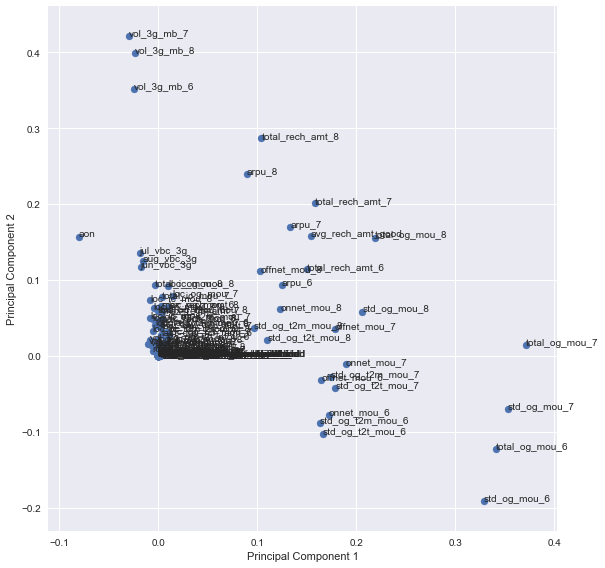

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

In [43]:
pca.explained_variance_ratio_

array([2.83763412e-01, 1.37394192e-01, 1.00778547e-01, 9.43695119e-02,
       7.37272405e-02, 5.50101026e-02, 4.43052119e-02, 3.33892663e-02,
       2.10243420e-02, 1.81097747e-02, 1.72186015e-02, 1.11787640e-02,
       1.05466383e-02, 9.70539180e-03, 8.23282032e-03, 8.06591714e-03,
       7.63858476e-03, 6.92182218e-03, 6.56474367e-03, 5.53584343e-03,
       5.25432790e-03, 4.86123249e-03, 3.02023171e-03, 2.82002462e-03,
       2.66222237e-03, 2.54077751e-03, 2.27973766e-03, 1.93829189e-03,
       1.89859182e-03, 1.70392086e-03, 1.62588306e-03, 1.39618093e-03,
       1.34592417e-03, 1.20730811e-03, 1.19009921e-03, 9.89707146e-04,
       9.72421167e-04, 7.76950052e-04, 7.17970872e-04, 6.94336846e-04,
       6.66826379e-04, 5.96197926e-04, 5.56373179e-04, 4.65098265e-04,
       4.39635059e-04, 4.23996088e-04, 4.22397599e-04, 3.51064943e-04,
       3.34658498e-04, 2.97835123e-04, 2.88513952e-04, 2.43262783e-04,
       2.34368939e-04, 2.22637920e-04, 1.53558709e-04, 1.32050208e-04,
      

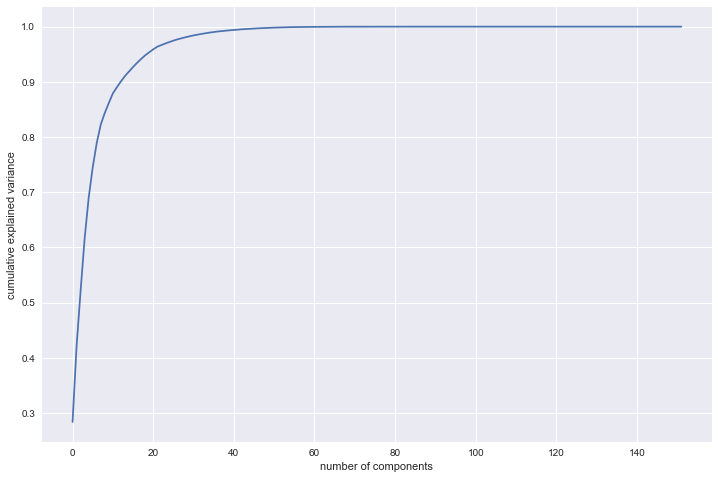

In [44]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [46]:
#Using incremental PCA over regular PCA for more precision
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=20)

In [47]:
#Fitting the incremental PCA on train data
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(37109, 20)

In [48]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

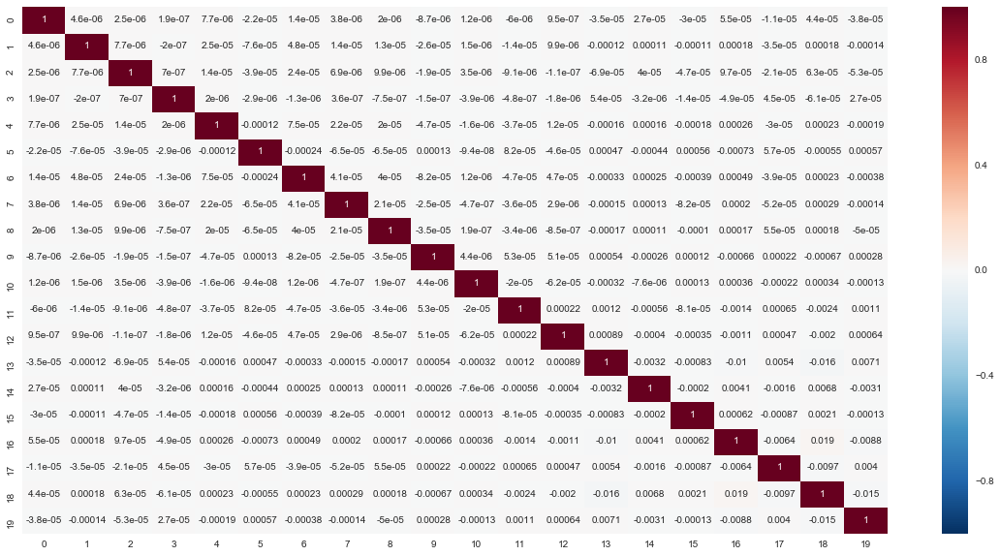

In [49]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [50]:
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)

# we see that correlations are close to 0, hence the multicolinearity is effectively treated; making the PCAs independent.

('max corr:', 0.019010730783433318, ', min corr: ', -0.01577220455822524)


In [51]:
#Applying selected components to the test data - 9 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(15905, 20)

In [52]:
#Setting the variance to be captured and letting the PCA suggest the no. of components
pca_again = PCA(0.95)
df_train_pca2 = pca_again.fit_transform(X_train)
df_train_pca2.shape

(37109, 20)

In [53]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [54]:
# Running the random forest with default parameters.
rfc = RandomForestClassifier()

# fit the rf model on PCAs
model_pca= rfc.fit(df_train_pca,y_train)

C:\ProgramData\Anaconda2\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [55]:
#Making prediction on the PCA transformed test data
predictions = model_pca.predict(df_test_pca)

Model Evaluation using confusion matrix

In [56]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [57]:
#Report of the default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      7943
           1       0.99      1.00      1.00      7962

   micro avg       1.00      1.00      1.00     15905
   macro avg       1.00      1.00      1.00     15905
weighted avg       1.00      1.00      1.00     15905



In [58]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[7865   78]
 [   0 7962]]


In [115]:
TP = 7962 # true positive 
TN = 7865 # true negatives
FP = 78 # false positives
FN = 0 # false negatives
total = 15905

In [112]:
# Calculating sensitivity or TPR (When it is churn, and it predicts churn)
TP / float(TP+FN)
#The model predicts churn 100% correctly

1.0

In [113]:
# Calculating specificity or TNR (When it is no churn and it predicts no churn)
TN / float(TN+FP)

#Model predicts no churn 99% correctly.

0.9901800327332242

In [125]:
# Calculate false postive rate - predicting churn when customer has not churned
print(FP/ float(TN+FP))

0.00981996726678


In [126]:
# Positive predictive value 
print (TP / float(TP+FP))

0.990298507463


In [127]:
# Negative predictive value
print (TN / float(TN+ FN))

1.0


In [59]:
#Model Accuracy of 99% is achieved with default RF model.
print(accuracy_score(y_test,predictions))

0.9950958817981767


Although the default RF model gives stupendous results, let's once try using hyperparameter tuning for RF.

In [ ]:
#Tuning for max_depth

In [60]:
# GridSearchCV to find max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 10, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': [2, 7]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [61]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

C:\ProgramData\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:125: FutureWarning: You are accessing a training score ('mean_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\ProgramData\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\ProgramData\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\ProgramData\Anaconda2\lib\site-packages\sklearn\utils\

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_depth,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.3046,0.0094,0.753510,0.756757,2,{u'max_depth': 2},2,0.740097,0.752888,0.772164,0.778118,0.759229,0.746286,0.750202,0.749352,0.745856,0.757141,0.030611,0.0008,0.011226,0.011277
1,0.6972,0.0118,0.874667,0.881504,7,{u'max_depth': 7},1,0.872002,0.880689,0.872406,0.878937,0.881299,0.886684,0.874158,0.879341,0.873467,0.881871,0.038989,0.0004,0.003403,0.002789


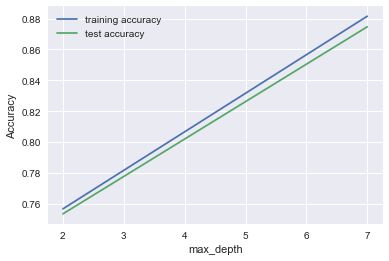

In [62]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

The graph for max_depth for training and testing PCA data is almost consistent and show slight deviation from max_depth>5 onwards.

Tuning min_leaf_samples

In [69]:
# GridSearchCV to find optimal min_sample_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
rf = RandomForestClassifier(max_depth=5)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_leaf': [5, 25, 45, 65, 85, 105, 125, 145, 165, 185]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [71]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_leaf,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.6004,0.0124,0.821714,0.827003,5,{u'min_samples_leaf': 5},2,0.812045,0.826591,0.827136,0.827433,0.827136,0.822784,0.820129,0.825951,0.822126,0.832255,0.034691,0.001625,0.005567,0.003061
1,0.5444,0.0114,0.822523,0.827872,25,{u'min_samples_leaf': 25},1,0.817974,0.828544,0.815683,0.821673,0.841148,0.838246,0.829426,0.831812,0.808382,0.819085,0.020723,0.001356,0.011506,0.006917
2,0.6450,0.0116,0.815543,0.820434,45,{u'min_samples_leaf': 45},7,0.815548,0.825109,0.817030,0.819584,0.808003,0.813487,0.823632,0.821336,0.813502,0.822656,0.100435,0.001357,0.005073,0.003914
3,0.6446,0.0138,0.821364,0.825332,65,{u'min_samples_leaf': 65},3,0.815818,0.819685,0.829561,0.836494,0.827001,0.823963,0.819995,0.822549,0.814445,0.823969,0.106455,0.002926,0.005991,0.005796
4,0.6366,0.0136,0.818723,0.822186,85,{u'min_samples_leaf': 85},5,0.810563,0.819887,0.822824,0.818069,0.820938,0.825445,0.827540,0.825008,0.811750,0.822521,0.051438,0.002417,0.006552,0.002861


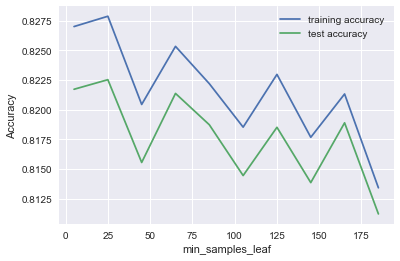

In [72]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Fitting a Decision Tree - Model 2

Using grid search for hyperparameter tuning of Decision Tree

In [73]:
from sklearn.tree import DecisionTreeClassifier

In [74]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(df_train_pca,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:   55.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': [50, 100], 'criterion': ['entropy', 'gini'], 'max_depth': [5, 10], 'min_samples_leaf': [50, 100]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [75]:
# cross validation results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.6864,0.0024,0.797839,0.800911,entropy,5,50,50,"{u'min_samples_split': 50, u'criterion': u'ent...",13,0.800728,0.802304,0.796012,0.801765,0.793991,0.798363,0.799380,0.797487,0.799084,0.804635,0.058776,0.000490,0.002466,0.002636
1,0.6580,0.0022,0.797839,0.800911,entropy,5,50,100,"{u'min_samples_split': 100, u'criterion': u'en...",13,0.800728,0.802304,0.796012,0.801765,0.793991,0.798363,0.799380,0.797487,0.799084,0.804635,0.043589,0.000400,0.002466,0.002636
2,0.6448,0.0028,0.794821,0.798095,entropy,5,100,50,"{u'min_samples_split': 50, u'criterion': u'ent...",15,0.797763,0.798936,0.793317,0.799306,0.790488,0.795095,0.796551,0.794691,0.795984,0.802445,0.032652,0.000400,0.002609,0.002887
3,0.7440,0.0026,0.794821,0.798095,entropy,5,100,100,"{u'min_samples_split': 100, u'criterion': u'en...",15,0.797763,0.798936,0.793317,0.799306,0.790488,0.795095,0.796551,0.794691,0.795984,0.802445,0.086030,0.000490,0.002609,0.002887
4,1.2706,0.0030,0.871945,0.881363,entropy,10,50,50,"{u'min_samples_split': 50, u'criterion': u'ent...",3,0.872811,0.880049,0.876718,0.886819,0.862705,0.870010,0.871598,0.881362,0.875893,0.888575,0.089652,0.000632,0.004992,0.006517
5,1.1116,0.0030,0.871891,0.881363,entropy,10,50,100,"{u'min_samples_split': 100, u'criterion': u'en...",4,0.873215,0.880049,0.876583,0.886819,0.862705,0.870010,0.871059,0.881362,0.875893,0.888575,0.064945,0.000632,0.004997,0.006517
6,1.1014,0.0030,0.856558,0.863827,entropy,10,100,50,"{u'min_samples_split': 50, u'criterion': u'ent...",5,0.856103,0.865227,0.862840,0.865699,0.850849,0.858591,0.856508,0.862330,0.856488,0.867286,0.031449,0.000632,0.003802,0.003069
7,0.9818,0.0024,0.856558,0.863827,entropy,10,100,100,"{u'min_samples_split': 100, u'criterion': u'en...",5,0.856103,0.865227,0.862840,0.865699,0.850849,0.858591,0.856508,0.862330,0.856488,0.867286,0.079703,0.000490,0.003802,0.003069
8,0.3476,0.0022,0.810262,0.814728,gini,5,50,50,"{u'min_samples_split': 50, u'criterion': u'gin...",9,0.817974,0.816182,0.805039,0.813487,0.804096,0.806649,0.813797,0.820494,0.810403,0.816828,0.002871,0.000400,0.005240,0.004617
9,0.3472,0.0024,0.810262,0.814728,gini,5,50,100,"{u'min_samples_split': 100, u'criterion': u'gi...",9,0.817974,0.816182,0.805039,0.813487,0.804096,0.806649,0.813797,0.820494,0.810403,0.816828,0.003429,0.000490,0.005240,0.004617


In [76]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

('best accuracy', 0.8744509418200437)
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [77]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = None,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_gini.fit(df_train_pca, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [78]:
# accuracy score for DT after hyperparameter tuning
clf_gini.score(df_test_pca,y_test)

0.8795976108142094

In [79]:
# classification metrics
from sklearn.metrics import classification_report,confusion_matrix
y_pred = clf_gini.predict(df_test_pca)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.85      0.88      7943
           1       0.86      0.91      0.88      7962

   micro avg       0.88      0.88      0.88     15905
   macro avg       0.88      0.88      0.88     15905
weighted avg       0.88      0.88      0.88     15905



In [80]:
# confusion matrix
print(confusion_matrix(y_test,y_pred))

[[6780 1163]
 [ 752 7210]]


In [ ]:
TP = 7210 # true positive 
TN = 6780 # true negatives
FP = 1163 # false positives
FN = 752 # false negatives

In [120]:
# sensitivity of the model
TP / float(TP+FN)

1.0

In [121]:
#calculate specificity
TN / float(TN+FP)

0.9901800327332242

In [122]:
#false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.00981996726678


In [123]:
# Positive predictive value 
print (TP / float(TP+FP))

0.990298507463


In [124]:
# Negative predictive value
print (TN / float(TN+ FN))

1.0


# Conclusion: based on the model metrics for default RF and tuned DT, the Random forest gives better accuracy of 99% where DT gives an accuracy of only 88%. Surely Random Forest proves to be the better model than a fined tuned DT. However the confusion matrix shows comparable results.


# Important Predictors

In [81]:
#Prepare data for logistic
data_DT = pd.DataFrame(data_HV)
data_DT.shape

(27418, 154)

In [82]:
data_DT.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_amt_good,churn,avg_arpu_good_ind,avg_onnet_mou_good_ind,avg_offnet_mou_good_ind,avg_roam_ic_mou_good_ind,avg_roam_og_mou_good_ind,avg_loc_og_t2t_mou_good_ind,avg_loc_og_t2m_mou_good_ind,avg_loc_og_t2f_mou_good_ind,avg_loc_og_t2c_mou_good_ind,avg_loc_og_mou_good_ind,avg_std_og_t2t_mou_good_ind,avg_std_og_t2m_mou_good_ind,avg_std_og_t2f_mou_good_ind,avg_std_og_mou_good_ind,avg_total_og_mou_good_ind,avg_og_others_good_ind,avg_spl_og_mou_good_ind,avg_isd_og_mou_good_ind,avg_vbc_3g_good_ind,avg_sachet_3g_good_ind,avg_monthly_3g_good_ind,avg_sachet_2g_good_ind,avg_monthly_2g_good_ind,avg_vol_3g_mb_good_ind,avg_vol_2g_mb_good_ind,avg_max_rech_amt_good_ind,active_days
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.0,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.0,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,0,1,1,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,1,0,0,0,1,1,1,1,66
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.0,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.0,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,380.0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,71
16,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.

In [83]:
pp.ProfileReport(data_DT)

Number of variables,155
Number of observations,27418
Total Missing (%),0.0%
Total size in memory,32.4 MiB
Average record size in memory,1.2 KiB
Numeric,122
Categorical,0
Boolean,27
Date,0
Text (Unique),0
Rejected,6


In [51]:
# #Dropping Correlated variables (only for logistic regression, to find out important predictors)
# data_LR = data_LR.drop(columns=['avg_rech_amt_good','total_rech_amt_7','total_rech_amt_8'],axis=1)
# data_LR.shape

(27418, 125)

In [84]:
#Train-test split; importing library
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler


In [85]:
# Putting response variable to y
y = data_DT['churn']
y.head(10)

8     0
13    0
16    0
17    0
21    0
24    0
33    0
38    0
41    0
48    0
Name: churn, dtype: int64

In [86]:
# Putting feature variable to X
X = data_DT.drop(['mobile_number','churn'], axis=1)
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_amt_good,avg_arpu_good_ind,avg_onnet_mou_good_ind,avg_offnet_mou_good_ind,avg_roam_ic_mou_good_ind,avg_roam_og_mou_good_ind,avg_loc_og_t2t_mou_good_ind,avg_loc_og_t2m_mou_good_ind,avg_loc_og_t2f_mou_good_ind,avg_loc_og_t2c_mou_good_ind,avg_loc_og_mou_good_ind,avg_std_og_t2t_mou_good_ind,avg_std_og_t2m_mou_good_ind,avg_std_og_t2f_mou_good_ind,avg_std_og_mou_good_ind,avg_total_og_mou_good_ind,avg_og_others_good_ind,avg_spl_og_mou_good_ind,avg_isd_og_mou_good_ind,avg_vbc_3g_good_ind,avg_sachet_3g_good_ind,avg_monthly_3g_good_ind,avg_sachet_2g_good_ind,avg_monthly_2g_good_ind,avg_vol_3g_mb_good_ind,avg_vol_2g_mb_good_ind,avg_max_rech_amt_good_ind,active_days
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.0,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.0,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,1,1,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,1,0,0,0,1,1,1,1,66
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.0,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.0,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,380.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,71
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,

In [87]:
X.shape

(27418, 152)

In [88]:
y.shape

(27418,)

In [89]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3,train_size=0.7 , random_state=100)

In [90]:
#Handling class imabalance
ros = RandomOverSampler(random_state=0)
x_train_res, y_train_res = ros.fit_sample(X_train, y_train)

In [94]:
x_train_res.shape

(37114, 152)

In [95]:
y_train_res.shape

(37114,)

In [97]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(x_train_res,y_train_res)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  2.5min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': [50, 100], 'criterion': ['entropy', 'gini'], 'max_depth': [5, 10], 'min_samples_leaf': [50, 100]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [98]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,1.8868,0.0068,0.931697,0.934930,entropy,5,50,50,"{u'min_samples_split': 50, u'criterion': u'ent...",11,0.929688,0.936410,0.929418,0.936814,0.934923,0.932406,0.930746,0.933753,0.933711,0.935269,0.123239,0.000748,0.002218,0.001650
1,1.7866,0.0062,0.931643,0.934930,entropy,5,50,100,"{u'min_samples_split': 100, u'criterion': u'en...",12,0.929688,0.936410,0.929418,0.936814,0.934654,0.932406,0.930746,0.933753,0.933711,0.935269,0.082836,0.000400,0.002141,0.001650
2,1.7786,0.0068,0.930646,0.933192,entropy,5,100,50,"{u'min_samples_split': 50, u'criterion': u'ent...",14,0.929688,0.935534,0.928610,0.933648,0.935462,0.933652,0.930073,0.930992,0.929399,0.932137,0.072035,0.000400,0.002455,0.001540
3,1.7402,0.0062,0.930646,0.933192,entropy,5,100,100,"{u'min_samples_split': 100, u'criterion': u'en...",14,0.929688,0.935534,0.928610,0.933648,0.935462,0.933652,0.930073,0.930992,0.929399,0.932137,0.031789,0.000400,0.002455,0.001540
4,2.2830,0.0066,0.955300,0.959826,entropy,10,50,50,"{u'min_samples_split': 50, u'criterion': u'ent...",1,0.955145,0.960189,0.953529,0.960728,0.957828,0.959215,0.954999,0.959349,0.954999,0.959652,0.107449,0.000490,0.001395,0.000561
5,2.2594,0.0066,0.955219,0.959833,entropy,10,50,100,"{u'min_samples_split': 100, u'criterion': u'en...",2,0.954741,0.960222,0.953529,0.960728,0.957828,0.959215,0.954999,0.959349,0.954999,0.959652,0.058878,0.000490,0.001413,0.000566
6,2.1128,0.0066,0.943741,0.947021,entropy,10,100,50,"{u'min_samples_split': 50, u'criterion': u'ent...",6,0.944100,0.947693,0.941945,0.948164,0.943816,0.947023,0.945567,0.945642,0.943277,0.946585,0.028701,0.000490,0.001176,0.000878
7,2.2516,0.0070,0.943876,0.947021,entropy,10,100,100,"{u'min_samples_split': 100, u'criterion': u'en...",5,0.944774,0.947693,0.941945,0.948164,0.943816,0.947023,0.945567,0.945642,0.943277,0.946585,0.128501,0.000632,0.001246,0.000878
8,1.3744,0.0064,0.936062,0.938352,gini,5,50,50,"{u'min_samples_split': 50, u'criterion': u'gin...",9,0.931843,0.936578,0.935614,0.939306,0.937483,0.937155,0.936405,0.938165,0.938965,0.940556,0.072943,0.000490,0.002390,0.001441
9,1.3216,0.0064,0.935927,0.938352,gini,5,50,100,"{u'min_samples_split': 100, u'criterion': u'gi...",10,0.931843,0.936578,0.935614,0.939306,0.937348,0.937155,0.936405,0.938165,0.938426,0.940556,0.003382,0.000490,0.002248,0.001441


In [99]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

('best accuracy', 0.9552998868351565)
DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [100]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = None,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_entropy.fit(x_train_res, y_train_res)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [101]:
# accuracy score
clf_entropy.score(X_test,y_test)

0.9321663019693655

In [102]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [103]:
# Putting features
features = list(X.columns)
features


['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t

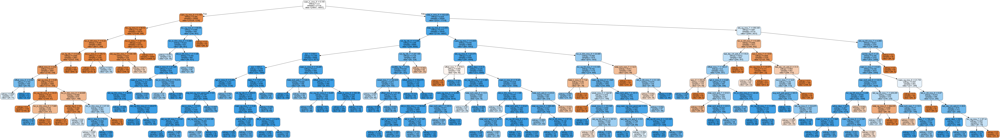

In [104]:
# plotting the tree

dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

A decision tree with max_depth=10 ia very difficult to interpret. Hence reducing the depth to 3 and then checking the score.

In [105]:
# model with max_depth = 3
clf_entropy = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=3, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [106]:
# Not much changes with the accuracy score using max_depth=3,and makes it readable
clf_entropy.score(X_test,y_test)

0.9664478482859227

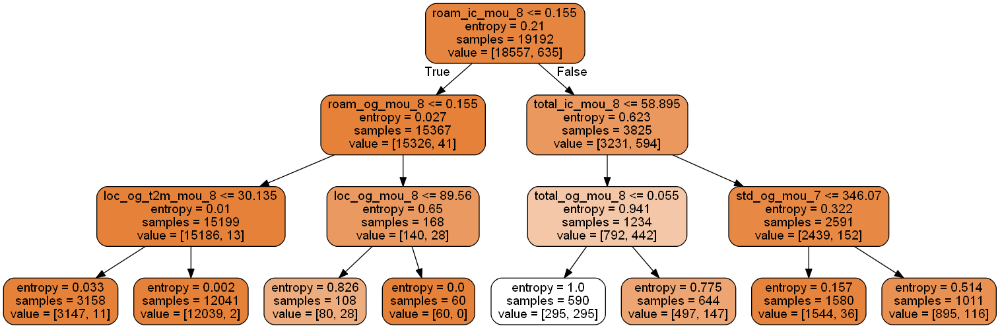

In [107]:
# plotting the tree

dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# The final significant predictors are : roam_ic_mou_8, roam_og_mou_8, total_ic_mou_8, total_og_mou_8, std_og_mou_7, loc_og_mou_8, loc_og_t2m_mou_8 

Recommendations:
    1. customers with std outgoing minutes of usage in good phase less than 346.07 are prospective churn customers.
    2. customers with local outgoing minutes of usage in action phase less than 89.56 are prospective churn customers.
    3. customers with local outgoing T to M minutes of usage in action phase less than 30.135 are prospective churn customers. To prevent customers from churning away, special discounts or schemes can be offered.